# Assignment 1: Wrangling and EDA
### Foundations of Machine Learning

**Q1.** This question provides some practice cleaning variables which have common problems.
1. Numeric variable: For `airbnb_NYC.csv`, clean the `Price` variable as well as you can, and explain the choices you make. How many missing values do you end up with? (Hint: What happens to the formatting when a price goes over 999 dollars, say from 675 to 1,112?)
2. Categorical variable: For the Minnesota police use of for data, `mn_police_use_of_force.csv`, clean the `subject_injury` variable, handling the NA's; this gives a value `Yes` when a person was injured by police, and `No` when no injury occurred. What proportion of the values are missing? Cross-tabulate your cleaned `subject_injury` variable with the `force_type` variable. Are there any patterns regarding when the data are missing? For the remaining missing values, replace the `np.nan/None` values with the label `Missing`.
3. Dummy variable: For `metabric.csv`, convert the `Overall Survival Status` variable into a dummy/binary variable, taking the value 0 if the patient is deceased and 1 if they are living.
4. Missing values: For `airbnb_NYC.csv`, determine how many missing values of `Review Scores Rating` there are. Create a new variable, in which you impute the median score for non-missing observations to the missing ones. Why might this bias or otherwise negatively impact your results?

In [116]:
import pandas as pd 
import numpy as np

1. Numeric variable: For `airbnb_NYC.csv`, clean the `Price` variable as well as you can, and explain the choices you make. How many missing values do you end up with? (Hint: What happens to the formatting when a price goes over 999 dollars, say from 675 to 1,112?)

In [117]:
airbnb = pd.read_csv("datasets/airbnb_NYC.csv", encoding="latin1")
airbnb['Price'].isna().sum()
#there are now NaN values is 'Price'


0

In [118]:
airbnb.head(10000)

,Host Id,Host Since,Name,Neighbourhood,Property Type,Review Scores Rating (bin),Room Type,Zipcode,Beds,Number of Records,Number Of Reviews,Price,Review Scores Rating
0,5162530,NaN,1 Bedroom in Prime Williamsburg,Brooklyn,Apartment,NaN,Entire home/apt,11249.0,1.0,1,0,145,NaN
1,33134899,NaN,"Sunny, Private room in Bushwick",Brooklyn,Apartment,NaN,Private room,11206.0,1.0,1,1,37,NaN
2,39608626,NaN,Sunny Room in Harlem,Manhattan,Apartment,NaN,Private room,10032.0,1.0,1,1,28,NaN
3,500,6/26/2008,Gorgeous 1 BR with Private Balcony,Manhattan,Apartment,NaN,Entire home/apt,10024.0,3.0,1,0,199,NaN
4,500,6/26/2008,Trendy Times Square Loft,Manhattan,Apartment,95.0,Private room,10036.0,3.0,1,39,549,96.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,4093526,11/8/2012,Room in Modern Downtown Apt,Manhattan,Apartment,100.0,Private room,10005.0,1.0,1,1,299,100.0
9996,4097717,11/8/2012,Room in the Heart of East Village,Manhattan,Apartment,100.0,Private room,10009.0,1.0,1,1,75,100.0
9997,4095719,11/8/2012,NYC Apartment Share,Manhattan,Apartment,NaN,Private room,10030.0,NaN,1,0,100,NaN
9998,4092307,11/8/2012,1 BR in large full floor apartment,Manhattan,Apartment,100.0,Private room,10038.0,1.0,1,2,125,100.0


In [119]:
airbnb['Price'].describe()
#there are 30478 observation of Price, 511 different unique values, highest most common value that appears 1418

count     30478
unique      511
top         150
freq       1481
Name: Price, dtype: object

In [120]:

string = airbnb['Price'].map(type)==str
string
#all values are strings

0        True
1        True
2        True
3        True
4        True
         ... 
30473    True
30474    True
30475    True
30476    True
30477    True
Name: Price, Length: 30478, dtype: bool

In [121]:
airbnb["Price_clean"] = (airbnb["Price"].astype(str).str.replace(",", "", regex=False)  .str.strip())
#remove all commas (values above 999)
airbnb["Price_clean"] = pd.to_numeric(
    airbnb["Price_clean"], errors="coerce"
)
airbnb['Price_clean'].describe()
#changes the column into numeric for df.describe()

count    30478.000000
mean       163.589737
std        197.785454
min         10.000000
25%         80.000000
50%        125.000000
75%        195.000000
max      10000.000000
Name: Price_clean, dtype: float64

1. Categorical variable: For the Minnesota police use of for data, `mn_police_use_of_force.csv`, clean the `subject_injury` variable, handling the NA's; this gives a value `Yes` when a person was injured by police, and `No` when no injury occurred. What proportion of the values are missing? Cross-tabulate your cleaned `subject_injury` variable with the `force_type` variable. Are there any patterns regarding when the data are missing? For the remaining missing values, replace the `np.nan/None` values with the label `Missing`.

In [122]:
police = pd.read_csv('datasets/mn_police_use_of_force.csv')
police.head()

,response_datetime,problem,is_911_call,primary_offense,subject_injury,force_type,force_type_action,race,sex,age,type_resistance,precinct,neighborhood
0,2016/01/01 00:47:36,Assault in Progress,Yes,DASLT1,NaN,Bodily Force,Body Weight to Pin,Black,Male,20.0,Tensed,1,Downtown East
1,2016/01/01 02:19:34,Fight,No,DISCON,NaN,Chemical Irritant,Personal Mace,Black,Female,27.0,Verbal Non-Compliance,1,Downtown West
2,2016/01/01 02:19:34,Fight,No,DISCON,NaN,Chemical Irritant,Personal Mace,White,Female,23.0,Verbal Non-Compliance,1,Downtown West
3,2016/01/01 02:28:48,Fight,No,PRIORI,NaN,Chemical Irritant,Crowd Control Mace,Black,Male,20.0,Commission of Crime,1,Downtown West
4,2016/01/01 02:28:48,Fight,No,PRIORI,NaN,Chemical Irritant,Crowd Control Mace,Black,Male,20.0,Commission of Crime,1,Downtown West


In [123]:
police

,response_datetime,problem,is_911_call,primary_offense,subject_injury,force_type,force_type_action,race,sex,age,type_resistance,precinct,neighborhood
0,2016/01/01 00:47:36,Assault in Progress,Yes,DASLT1,NaN,Bodily Force,Body Weight to Pin,Black,Male,20.0,Tensed,1,Downtown East
1,2016/01/01 02:19:34,Fight,No,DISCON,NaN,Chemical Irritant,Personal Mace,Black,Female,27.0,Verbal Non-Compliance,1,Downtown West
2,2016/01/01 02:19:34,Fight,No,DISCON,NaN,Chemical Irritant,Personal Mace,White,Female,23.0,Verbal Non-Compliance,1,Downtown West
3,2016/01/01 02:28:48,Fight,No,PRIORI,NaN,Chemical Irritant,Crowd Control Mace,Black,Male,20.0,Commission of Crime,1,Downtown West
4,2016/01/01 02:28:48,Fight,No,PRIORI,NaN,Chemical Irritant,Crowd Control Mace,Black,Male,20.0,Commission of Crime,1,Downtown West
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12920,2021/08/30 21:38:46,Assault in Progress,Yes,ASLT5,NaN,Bodily Force,Joint Lock,White,Female,69.0,NaN,1,Loring Park
12921,2021/08/30 22:32:22,Unwanted Person,Yes,CIC,NaN,Bodily Force,Joint Lock,NaN,NaN,NaN,NaN,1,Cedar Riverside
12922,2021/08/31 12:03:08,Overdose w/All,Yes,FORCE,NaN,Bodily Force,Body Weight Pin,Black,Male,NaN,NaN,3,Seward
12923,2021/08/31 12:52:52,Attempt Pick-Up,No,WT,NaN,Bodily Force,Body Weight Pin,Black,Male,31.0,NaN,4,Camden Industrial


In [124]:
police['subject_injury'].isna().sum()
# number of NaN values in column

9848

In [125]:
police['subject_injury'].value_counts()
# number of binary values in column

subject_injury
Yes    1631
No     1446
Name: count, dtype: int64

In [126]:
9948 / (9948+1631+1446)
# 76% of the subject injury column had missing data

0.7637619961612284

In [127]:
police["subject_injury_clean"] = police["subject_injury"].replace({
    "Yes": "Yes",
    "No": "No"
})

In [128]:
police["subject_injury_clean"] = police["subject_injury_clean"].where(
    police["subject_injury_clean"].isin(["Yes", "No"]),
    np.nan
)

In [129]:
pd.crosstab(police["force_type"], police["subject_injury_clean"], dropna=False)
# the most amount of missing data comes from bodily force, it is also the most used force type
# the "lighter" consequences tend to have missing data

subject_injury_clean,No,Yes,NaN
force_type,,,
Baton,0,2,2
Bodily Force,1093,1286,7051
Chemical Irritant,131,41,1421
Firearm,2,0,0
Gun Point Display,33,44,27
Improvised Weapon,34,40,74
Less Lethal,0,0,87
Less Lethal Projectile,1,2,0
Maximal Restraint Technique,0,0,170


In [130]:
police["subject_injury_clean"] = police["subject_injury_clean"].fillna("Missing")
# changes NaN values to 'missing'

3. Dummy variable: For `metabric.csv`, convert the `Overall Survival Status` variable into a dummy/binary variable, taking the value 0 if the patient is deceased and 1 if they are living.

In [131]:
metabric = pd.read_csv('datasets/metabric.csv')
metabric['Overall Survival Status'].value_counts()

Overall Survival Status
1:DECEASED    768
0:LIVING      575
Name: count, dtype: int64

In [132]:
metabric["Overall Survival Status"] = (
    metabric["Overall Survival Status"]
    .str.replace(r"^\d+:", "", regex=True)
    .map({"LIVING": 1, "DECEASED": 0})
)
# maps binary values of 1 and 0 to living and deceased

In [133]:
metabric['Overall Survival Status'].value_counts()
metabric

,Age at Diagnosis,Type of Breast Surgery,Cancer Type,Chemotherapy,Hormone Therapy,Lymph nodes examined positive,Mutation Count,Nottingham prognostic index,Overall Survival (Months),Overall Survival Status,Radio Therapy,TMB (nonsynonymous),Tumor Size,Tumor Stage
0,43.19,BREAST CONSERVING,Breast Cancer,NO,YES,0.0,2.0,4.020,84.633333,1,YES,2.615035,10.0,1.0
1,48.87,MASTECTOMY,Breast Cancer,YES,YES,1.0,2.0,4.030,163.700000,0,NO,2.615035,15.0,2.0
2,47.68,MASTECTOMY,Breast Cancer,YES,YES,3.0,1.0,4.050,164.933333,1,YES,1.307518,25.0,2.0
3,76.97,MASTECTOMY,Breast Cancer,YES,YES,8.0,2.0,6.080,41.366667,0,YES,2.615035,40.0,2.0
4,78.77,MASTECTOMY,Breast Cancer,NO,YES,0.0,4.0,4.062,7.800000,0,YES,5.230071,31.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1338,70.65,BREAST CONSERVING,Breast Cancer,NO,NO,0.0,9.0,2.040,201.166667,1,YES,11.767659,20.0,1.0
1339,75.62,MASTECTOMY,Breast Cancer,NO,NO,0.0,4.0,4.040,105.200000,0,NO,5.230071,20.0,1.0
1340,52.84,BREAST CONSERVING,Breast Cancer,YES,NO,6.0,5.0,5.040,200.333333,1,YES,6.537589,20.0,2.0
1341,48.59,MASTECTOMY,Breast Cancer,YES,NO,1.0,6.0,5.060,14.700000,0,YES,7.845106,30.0,2.0


4. Missing values: For `airbnb_NYC.csv`, determine how many missing values of `Review Scores Rating` there are. Create a new variable, in which you impute the median score for non-missing observations to the missing ones. Why might this bias or otherwise negatively impact your results?

In [134]:
airbnb['Review Scores Rating'].isna().sum()

8323

In [135]:
median_rating = airbnb["Review Scores Rating"].median()
median_rating
#finds median rating

94.0

In [136]:
airbnb["Review_Scores_Imputed"] = airbnb["Review Scores Rating"].fillna(median_rating)
#this will negatively impact my results because it affects the mean which affects the std and variance, therefore it would be inaccurate data to use in a model

**Q2.** Go to https://sharkattackfile.net/ and download their dataset on shark attacks.

1. Open the shark attack file using Pandas. It is probably not a csv file, so `read_csv` won't work. What does work?
2. Drop any columns that do not contain data.
3. What is an observation? Carefully justify your answer, and explain how it affects your choices in cleaning and analyzing the data.
4. Clean the year variable. Describe the range of values you see. Filter the rows to focus on attacks since 1940. Are attacks increasing, decreasing, or remaining constant over time?
5. Clean the Age variable and make a histogram of the ages of the victims.
6. Clean the `Type` variable so it only takes three values: Provoked and Unprovoked and Unknown. What proportion of attacks are unprovoked?
7. Clean the `Fatal Y/N` variable so it only takes three values: Y, N, and Unknown.
8. Is the attack more or less likely to be fatal when the attack is provoked or unprovoked? Thoughts?

In [137]:
%pip install xlrd
# needed to read in dataset


[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


1. Open the shark attack file using Pandas. It is probably not a csv file, so `read_csv` won't work. What does work?

In [138]:
sharks = pd.read_excel("GSAF5.xls", engine = 'xlrd')
sharks.head()


,Date,Year,Type,Country,State,Location,Activity,Name,Sex,Age,...,Species,Source,pdf,href formula,href,Case Number,Case Number.1,original order,Unnamed: 21,Unnamed: 22
0,29th January,2026.0,Unprovoked,Brazil,Recife,Del Chifre Beach in Olinda,Swimming,Deivson Rocha Dantas,M,13,...,Unknown bull and tiger sharks frequent the area,Kevin McMurray Trackingsharks.com: TV Globo: P...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,29th January,2026.0,Unprovoked,Australia,NSW,Angels Beach East Ballina,Surfing,Unnamed man,M,?,...,Unknown,Bob Myatt GSAF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24th January,2026.0,Unprovoked,Australia,Tasmania,Cooee Beach west of Burnie,Swimming,Megan Stokes,F,?,...,1.7m Seven Gill shark,Bob Myatt GSAF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20th January,2026.0,Unprovoked,Australia,NSW,Point Plomber North of Port Macquarie,Surfing,Paul Zvirdinas,M,39,...,Bull shark,Bob Myatt GSAF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,19th January,2026.0,Unprovoked,Australia,NSW,Dee Why,Surfing,Unknown,M,11,...,Bull shark,Andy Currie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


2. Drop any columns that do not contain data.

In [139]:
sharks.drop(columns = ['Unnamed: 21', 'Unnamed: 22'])

,Date,Year,Type,Country,State,Location,Activity,Name,Sex,Age,...,Fatal Y/N,Time,Species,Source,pdf,href formula,href,Case Number,Case Number.1,original order
0,29th January,2026.0,Unprovoked,Brazil,Recife,Del Chifre Beach in Olinda,Swimming,Deivson Rocha Dantas,M,13,...,Y,?,Unknown bull and tiger sharks frequent the area,Kevin McMurray Trackingsharks.com: TV Globo: P...,NaN,NaN,NaN,NaN,NaN,NaN
1,29th January,2026.0,Unprovoked,Australia,NSW,Angels Beach East Ballina,Surfing,Unnamed man,M,?,...,N,1100hrs,Unknown,Bob Myatt GSAF,NaN,NaN,NaN,NaN,NaN,NaN
2,24th January,2026.0,Unprovoked,Australia,Tasmania,Cooee Beach west of Burnie,Swimming,Megan Stokes,F,?,...,N,1815hrs,1.7m Seven Gill shark,Bob Myatt GSAF,NaN,NaN,NaN,NaN,NaN,NaN
3,20th January,2026.0,Unprovoked,Australia,NSW,Point Plomber North of Port Macquarie,Surfing,Paul Zvirdinas,M,39,...,N,0830hrs,Bull shark,Bob Myatt GSAF,NaN,NaN,NaN,NaN,NaN,NaN
4,19th January,2026.0,Unprovoked,Australia,NSW,Dee Why,Surfing,Unknown,M,11,...,N,1145hrs,Bull shark,Andy Currie,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7069,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,Roebuck Bay,Diving,male,M,NaN,...,Y,NaN,NaN,"H. Taunton; N. Bartlett, p. 234",ND-0005-RoebuckBay.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0005,ND.0005,6.0
7070,Before 1903,0.0,Unprovoked,AUSTRALIA,Western Australia,NaN,Pearl diving,Ahmun,M,NaN,...,Y,NaN,NaN,"H. Taunton; N. Bartlett, pp. 233-234",ND-0004-Ahmun.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0004,ND.0004,5.0
7071,1900-1905,0.0,Unprovoked,USA,North Carolina,Ocracoke Inlet,Swimming,Coast Guard personnel,M,NaN,...,Y,NaN,NaN,"F. Schwartz, p.23; C. Creswell, GSAF",ND-0003-Ocracoke_1900-1905.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0003,ND.0003,4.0
7072,1883-1889,0.0,Unprovoked,PANAMA,NaN,"Panama Bay 8ºN, 79ºW",NaN,Jules Patterson,M,NaN,...,Y,NaN,NaN,"The Sun, 10/20/1938",ND-0002-JulesPatterson.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,ND.0002,ND.0002,3.0


I iterated through each column and used isna().sum() to see if all the values in the column are NaN

3. What is an observation? Carefully justify your answer, and explain how it affects your choices in cleaning and analyzing the data.

An observation is a series of features for a singular shark incident. This affects my choice in cleaning and analyzing data because if I drop certain rows, I would be neglecting shark incidents.

4. Clean the year variable. Describe the range of values you see. Filter the rows to focus on attacks since 1940. Are attacks increasing, decreasing, or remaining constant over time?

In [140]:
sharks['Year_clean'] = pd.to_numeric(sharks['Year'], errors = 'coerce')

sharks_1940 = sharks[sharks['Year_clean'] >= 1940].copy()
print(sharks_1940.shape[0])

5538


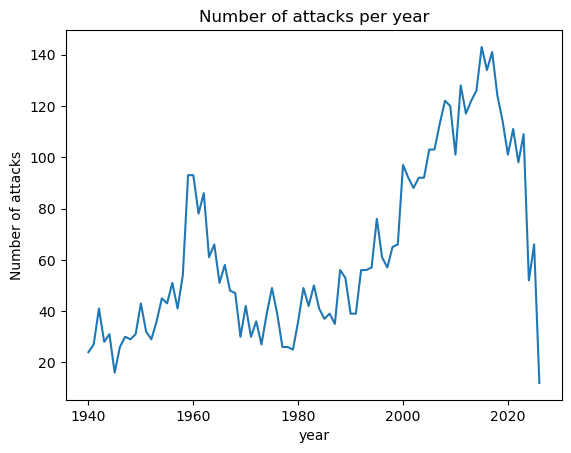

In [141]:
import matplotlib.pyplot as plt
years = sharks_1940['Year_clean'].value_counts().sort_index()
years.plot()
plt.xlabel('year')
plt.ylabel('Number of attacks')
plt.title('Number of attacks per year')
plt.show()

5. Clean the Age variable and make a histogram of the ages of the victims.

In [142]:
sharks['Age_clean'] = (sharks['Age'].astype(str).str.extract(r'(\d+.?\d*)', expand = False))
sharks['Age_clean'] = pd.to_numeric(sharks['Age_clean'], errors = 'coerce')

In [143]:
sharks['Age_clean'].isna().sum()

3101

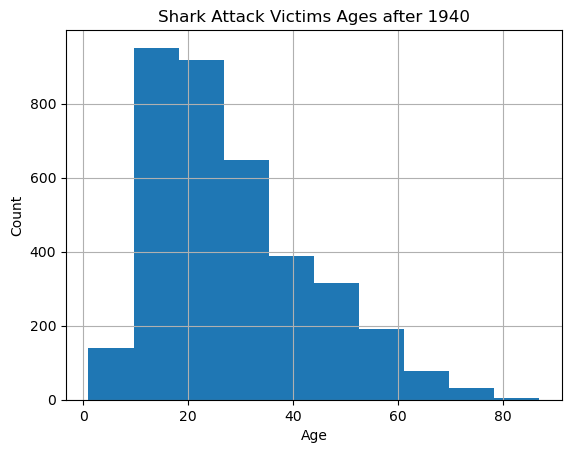

In [144]:
sharks_1940['Age_clean'] = (sharks['Age'].astype(str).str.extract(r'(\d+.?\d*)', expand = False))
sharks_1940['Age_clean'] = pd.to_numeric(sharks['Age_clean'], errors = 'coerce')
sharks_1940['Age_clean'].dropna().hist()
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Shark Attack Victims Ages after 1940')
plt.show()

6. Clean the `Type` variable so it only takes three values: Provoked and Unprovoked and Unknown. What proportion of attacks are unprovoked?

In [145]:
sharks_1940['Type'].value_counts()    

Type
Unprovoked             4125
Provoked                521
Invalid                 402
Watercraft              280
Sea Disaster            156
Questionable             26
Boat                      7
 Provoked                 2
unprovoked                1
?                         1
Unconfirmed               1
Unverified                1
Under investigation       1
Name: count, dtype: int64

In [146]:
sharks_1940['Type'] = sharks_1940['Type'].str.strip() 
sharks_1940['Type_clean'] = sharks_1940['Type'].apply(lambda x: x if x in ['Unprovoked', 'Provoked'] else 'Unknown')
#removes spaces in type and drops values except for those 3 values
sharks_1940['Type_clean'].value_counts()

Type_clean
Unprovoked    4125
Unknown        890
Provoked       523
Name: count, dtype: int64

In [147]:
prop_unprovoked = (sharks_1940['Type_clean'].value_counts(normalize=True)['Unprovoked'])
prop_unprovoked

0.7448537378114843

7. Clean the `Fatal Y/N` variable so it only takes three values: Y, N, and Unknown.

In [148]:
sharks_1940['Fatal Y/N'] = sharks_1940['Fatal Y/N'].str.strip().str.upper()
sharks_1940['Fatal_clean'] = sharks_1940['Fatal Y/N'].apply(lambda x: x if x in ['Y', 'N'] else 'Unknown')
#removes spaces and only filter for those 3 values
sharks_1940['Fatal_clean'].value_counts()

Fatal_clean
N          4246
Y           830
Unknown     462
Name: count, dtype: int64

8. Is the attack more or less likely to be fatal when the attack is provoked or unprovoked? Thoughts?

It is more likely to be a unprovoked attack if it fatal. This is most likely true because since it was unprovoked the person wasn't expecting to get attack and isn't ready to defend themselves.

**Q3.** Open the "tidy_data.pdf" document available in `https://github.com/ds4e/wrangling`, which is a paper called *Tidy Data* by Hadley Wickham.

  1. Read the abstract. What is this paper about?
  2. Read the introduction. What is the "tidy data standard" intended to accomplish?
  3. Read the intro to section 2. What does this sentence mean: "Like families, tidy datasets are all alike but every messy dataset is messy in its own way." What does this sentence mean: "For a given dataset, it’s usually easy to figure out what are observations and what are variables, but it is surprisingly difficult to precisely define variables and observations in general."
  4. Read Section 2.2. How does Wickham define values, variables, and observations?
  5. How is "Tidy Data" defined in section 2.3?
  6. Read the intro to Section 3 and Section 3.1. What are the 5 most common problems with messy datasets? Why are the data in Table 4 messy? What is "melting" a dataset?
  7. Why, specifically, is table 11 messy but table 12 tidy and "molten"?

  1. Read the abstract. What is this paper about?
   
It talks about data cleaning efficiency

  2. Read the introduction. What is the "tidy data standard" intended to accomplish?

It is intended to make collaboration easier and have sense of routine when exploring data.

  3. Read the intro to section 2. What does this sentence mean: "Like families, tidy datasets are all alike but every messy dataset is messy in its own way." What does this sentence mean: "For a given dataset, it’s usually easy to figure out what are observations and what are variables, but it is surprisingly difficult to precisely define variables and observations in general."

The first sentence means that tidy datasets tend to be formatted the same, but there are different nuances and different issues within each messy dataset that affect the comprehension of the data.

The second sentence means that it is easy to identify what an observation and variable is, in a sense that means which features create an observation and what are the features themselves, but it difficult to find the meaning behind an observation and it's features, such as how do the different features affect the overall "story".

  4. Read Section 2.2. How does Wickham define values, variables, and observations?

Values, variables, and observations are what create a dataset and values are attributed to variables which collectively attribute to an observation therefore a dataset is a series of observations

  5. How is "Tidy Data" defined in section 2.3?

Tidy data is a standard way of mapping the meaning of a dataset to its structure. A dataset is messy or tidy depending on how rows, columns and tables are matched up with observations, variables and types.

  6. Read the intro to Section 3 and Section 3.1. What are the 5 most common problems with messy datasets? Why are the data in Table 4 messy? What is "melting" a dataset?

5 most common problems are: columns headers are values rather than variable names, multiple variables can be stored in one columns, variables can be stored in rows and columns, different types of observations are stored in the same table, and a single observations can be stored in multiple tables.

Data in Table 4 is messy because income is stored as columns headers rather than a variable column

Melting a dataset is changing column headers into rows

  7. Why, specifically, is table 11 messy but table 12 tidy and "molten"?

It tidy and molten because each observation is a day (row) and each columns is a singl variable and the tmin and tmax are diferent columns, as well as, a datae is a 1 variable. Lastly, a observational unit is 1 day

**Q4.** This question looks at financial transfers from international actors to American universities. In particular, from which countries and giftors are the gifts coming from, and to which institutions are they going? 

For this question, `.groupby([vars]).count()` and `.groupby([vars]).sum()` will be especially useful to tally the number of occurrences and sum the values of those occurrences.

1. Load the `ForeignGifts_edu.csv` dataset.
2. For `Foreign Gift Amount`, create a histogram and describe the variable. Describe your findings.
3. For `Gift Type`, create a histogram or value counts table. What proportion of the gifts are contracts, real estate, and monetary gifts?
4. What are the top 15 countries in terms of the number of gifts? What are the top 15 countries in terms of the amount given?
5. What are the top 15 institutions in terms of the total amount of money they receive? Make a histogram of the total amount received by all institutions. 
6. Which giftors provide the most money, in total? 

1. Load the `ForeignGifts_edu.csv` dataset.

In [149]:
foreign_gifts = pd.read_csv('datasets/ForeignGifts_edu.csv')
foreign_gifts.head()

,ID,OPEID,Institution Name,City,State,Foreign Gift Received Date,Foreign Gift Amount,Gift Type,Country of Giftor,Giftor Name
0,1,102000,Jacksonville State University,Jacksonville,AL,43738,250000,Monetary Gift,CHINA,NaN
1,2,104700,Troy University,Troy,AL,43592,463657,Contract,CHINA,Confucius Institute Headquarters
2,3,105100,University of Alabama,Tuscaloosa,AL,43466,3649107,Contract,ENGLAND,Springer Nature Customer Service Ce
3,4,105100,University of Alabama,Tuscaloosa,AL,43472,1000,Contract,SAUDI ARABIA,Saudi Arabia Education Mission
4,5,105100,University of Alabama,Tuscaloosa,AL,43479,49476,Contract,SAUDI ARABIA,Saudi Arabia Education Mission


2. For `Foreign Gift Amount`, create a histogram and describe the variable. Describe your findings.


3. For `Gift Type`, create a histogram or value counts table. What proportion of the gifts are contracts, real estate, and monetary gifts?

In [150]:
foreign_gifts['Gift Type'].value_counts()

Gift Type
Contract         17274
Monetary Gift    10936
Real Estate         11
Name: count, dtype: int64

In [151]:
contract_proportion = 17274 / (17274 + 10936 + 11)
monetary_proportion = 10936 / (17274 + 10936 + 11)
real_proportion = 11 / (17274 + 10936 + 11)

print(f"Proportion of gifts that are contracts: {contract_proportion}\nProportion of gifts that are monetary gifts: {monetary_proportion}\nProportion of gifts that are real estate: {real_proportion}")

Proportion of gifts that are contracts: 0.6120973742957372
Proportion of gifts that are monetary gifts: 0.3875128450444704
Proportion of gifts that are real estate: 0.00038978065979235324


4. What are the top 15 countries in terms of the number of gifts? What are the top 15 countries in terms of the amount given?

In [152]:
top_15_countries = (foreign_gifts.groupby("Country of Giftor").size().sort_values(ascending=False).head(15))
top_15_countries

Country of Giftor
ENGLAND            3655
CHINA              2461
CANADA             2344
JAPAN              1896
SWITZERLAND        1676
SAUDI ARABIA       1610
FRANCE             1437
GERMANY            1394
HONG KONG          1080
SOUTH KOREA         811
QATAR               693
THE NETHERLANDS     512
KOREA               452
INDIA               434
TAIWAN              381
dtype: int64

5. What are the top 15 institutions in terms of the total amount of money they receive? Make a histogram of the total amount received by all institutions. 


In [153]:
top_15_institutions = (foreign_gifts.groupby("Institution Name").size().sort_values(ascending=False).head(15))
top_15_institutions

Institution Name
University of California, Los Angeles          3916
California Institute of Technology             2502
Columbia University in the City of New York    1127
Ohio State University (The)                    1014
Johns Hopkins University                        899
University of Michigan - Ann Arbor              715
Stanford University                             668
Cornell University                              653
University of Pennsylvania                      625
Massachusetts Institute of Technology           582
Yale University                                 550
Harvard University                              453
University of Colorado Denver                   436
University of Chicago (The)                     401
Arizona State University                        400
dtype: int64

6. Which giftors provide the most money, in total? 

In [154]:
top_giftors = (foreign_gifts.groupby("Giftor Name")["Foreign Gift Amount"].sum().sort_values(ascending=False))
top_giftors.head(1)

Giftor Name
Qatar Foundation    1166503744
Name: Foreign Gift Amount, dtype: int64

**Q5.** This question provides some practice doing exploratory data analysis and visualization.

We'll use the `college_completion.csv` dataset from the US Department of Education. The "relevant" variables for this question are:
  - `level` - Level of institution (4-year, 2-year)
  - `aid_value` - The average amount of student aid going to undergraduate recipients
  - `control` - Public, Private not-for-profit, Private for-profit
  - `grad_100_value` - percentage of first-time, full-time, degree-seeking undergraduates who complete a degree or certificate program within 100 percent of expected time (bachelor's-seeking group at 4-year institutions)

1. Load the `college_completion.csv` data with Pandas.
2. How many observations and variables are in the data? Use `.head()` to examine the first few rows of data.
3. Cross tabulate `control` and `level`. Describe the patterns you see in words.
4. For `grad_100_value`, create a kernel density plot and describe table. Now condition on `control`, and produce a kernel density plot and describe tables for each type of institutional control. Which type of institution appear to have the most favorable graduation rates?
5. Make a scatterplot of `grad_100_value` by `aid_value`, and compute the covariance and correlation between the two variables. Describe what you see. Now make the same plot and statistics, but conditioning on `control`. Describe what you see. For which kinds of institutions does aid seem to vary positively with graduation rates?

1. Load the `college_completion.csv` data with Pandas.


In [155]:
college_completion = pd.read_csv('datasets/college_completion.csv')

2. How many observations and variables are in the data? Use `.head()` to examine the first few rows of data.


In [156]:
college_completion.head()
#5 observations and 63 variables

,index,unitid,chronname,city,state,level,control,basic,hbcu,flagship,...,vsa_grad_after6_transfer,vsa_grad_elsewhere_after6_transfer,vsa_enroll_after6_transfer,vsa_enroll_elsewhere_after6_transfer,similar,state_sector_ct,carnegie_ct,counted_pct,nicknames,cohort_size
0,0,100654,Alabama A&M University,Normal,Alabama,4-year,Public,Masters Colleges and Universities--larger prog...,X,NaN,...,36.4,5.6,17.2,11.1,232937|100724|405997|113607|139533|144005|2285...,13,386,99.7|07,NaN,882.0
1,1,100663,University of Alabama at Birmingham,Birmingham,Alabama,4-year,Public,Research Universities--very high research acti...,NaN,NaN,...,NaN,NaN,NaN,NaN,196060|180461|201885|145600|209542|236939|1268...,13,106,56.0|07,UAB,1376.0
2,2,100690,Amridge University,Montgomery,Alabama,4-year,Private not-for-profit,Baccalaureate Colleges--Arts & Sciences,NaN,NaN,...,NaN,NaN,NaN,NaN,217925|441511|205124|247825|197647|221856|1353...,16,252,100.0|07,NaN,3.0
3,3,100706,University of Alabama at Huntsville,Huntsville,Alabama,4-year,Public,Research Universities--very high research acti...,NaN,NaN,...,0.0,0.0,0.0,0.0,232186|133881|196103|196413|207388|171128|1900...,13,106,43.1|07,UAH,759.0
4,4,100724,Alabama State University,Montgomery,Alabama,4-year,Public,Masters Colleges and Universities--larger prog...,X,NaN,...,NaN,NaN,NaN,NaN,100654|232937|242617|243197|144005|241739|2354...,13,386,88.0|07,ASU,1351.0


3. Cross tabulate `control` and `level`. Describe the patterns you see in words.


In [157]:
pd.crosstab(college_completion['control'], college_completion['level'])
# most private not-for-profit institutions are 4 year colleges and most public colleges are 2 year colleges

level,2-year,4-year
control,,
Private for-profit,465,527
Private not-for-profit,68,1180
Public,926,632


4. For `grad_100_value`, create a kernel density plot and describe table. Now condition on `control`, and produce a kernel density plot and describe tables for each type of institutional control. Which type of institution appear to have the most favorable graduation rates?


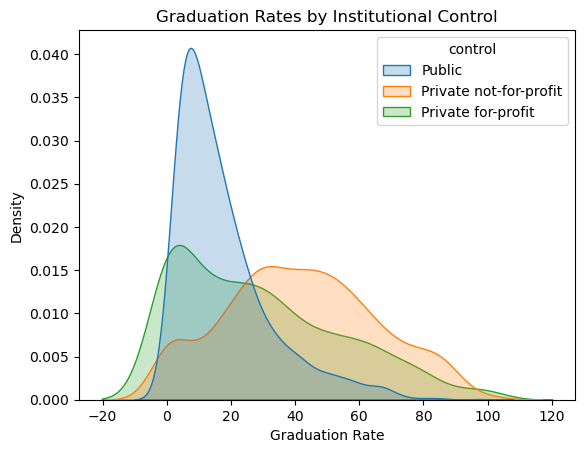

,count,mean,std,min,25%,50%,75%,max
control,,,,,,,,
Private for-profit,779.0,29.108858,25.601687,0.0,6.95,24.7,46.75,100.0
Private not-for-profit,1189.0,41.660976,23.551231,0.0,25.00,41.0,58.30,100.0
Public,1499.0,17.430887,14.729443,0.0,6.90,13.2,23.25,97.8


In [158]:
import seaborn as sns

sns.kdeplot(data=college_completion, x="grad_100_value", hue="control", fill=True, common_norm=False)
plt.title("Graduation Rates by Institutional Control")
plt.xlabel("Graduation Rate")
plt.show()
college_completion.groupby("control")["grad_100_value"].describe()

5. Make a scatterplot of `grad_100_value` by `aid_value`, and compute the covariance and correlation between the two variables. Describe what you see. Now make the same plot and statistics, but conditioning on `control`. Describe what you see. For which kinds of institutions does aid seem to vary positively with graduation rates?

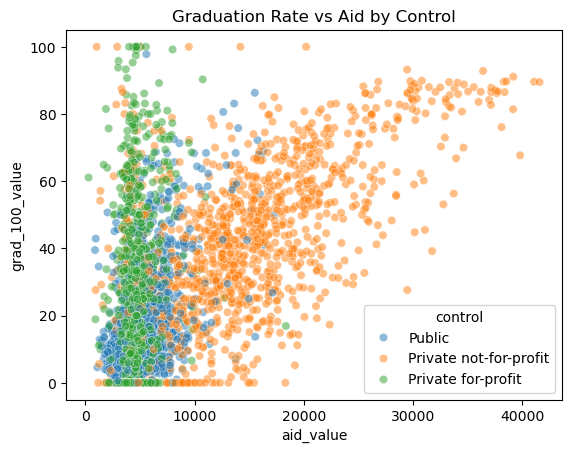

In [159]:
sns.scatterplot(data = college_completion, x = "aid_value", y = "grad_100_value", hue = "control", alpha = 0.5)
plt.title("Graduation Rate vs Aid by Control")
plt.show()

**Q6.** In class, we talked about how to compute the sample mean of a variable $X$,
$$
m(X) = \dfrac{1}{N} \sum_{i=1}^N x_i
$$
and sample covariance of two variables $X$ and $Y$,
$$
\text{cov}(X,Y) = \dfrac{1}{N} \sum_{i=1}^N (x_i - m(X))(y_i - m(Y))).
$$
Recall, the sample variance of $X$ is
$$
s^2 = \dfrac{1}{N} \sum_{i=1}^N (x_i - m(X))^2.
$$
It can be very helpful to understand some basic properties of these statistics. If you want to write your calculations on a piece of paper, take a photo, and upload that to your GitHub repo, that's probably easiest.

We're going to look at **linear transformations** of $X$, $Y = a + bX$. So we take each value of $X$, $x_i$, and transform it as $y_i = a + b x_i$. 

1. Show that $m(a + bX) = a+b \times m(X)$.
2. Show that $ \text{cov}(X,X) = s^2$.
3. Show that $\text{cov}(X,a+bY) = b \times \text{cov}(X,Y)$
4. Show that $\text{cov}(a+bX,a+bY) = b^2 \text{cov}(X,Y) $. Notice, this also means that $\text{cov}(bX, bX) = b^2 s^2$.
5. Suppose $b>0$ and let the median of $X$ be $\text{med}(X)$. Is it true that the median of $a+bX$ is equal to $a + b \times \text{med}(X)$? Is the IQR of $a + bX$ equal to $a + b \times \text{IQR}(X)$?
6. Show by example that the means of $X^2$ and $\sqrt{X}$ are generally not $(m(X))^2$ and $\sqrt{m(X)}$. So, the results we derived above really depend on the linearity of the transformation $Y = a + bX$, and transformations like $Y = X^2$ or $Y = \sqrt{X}$ will not behave in a similar way.

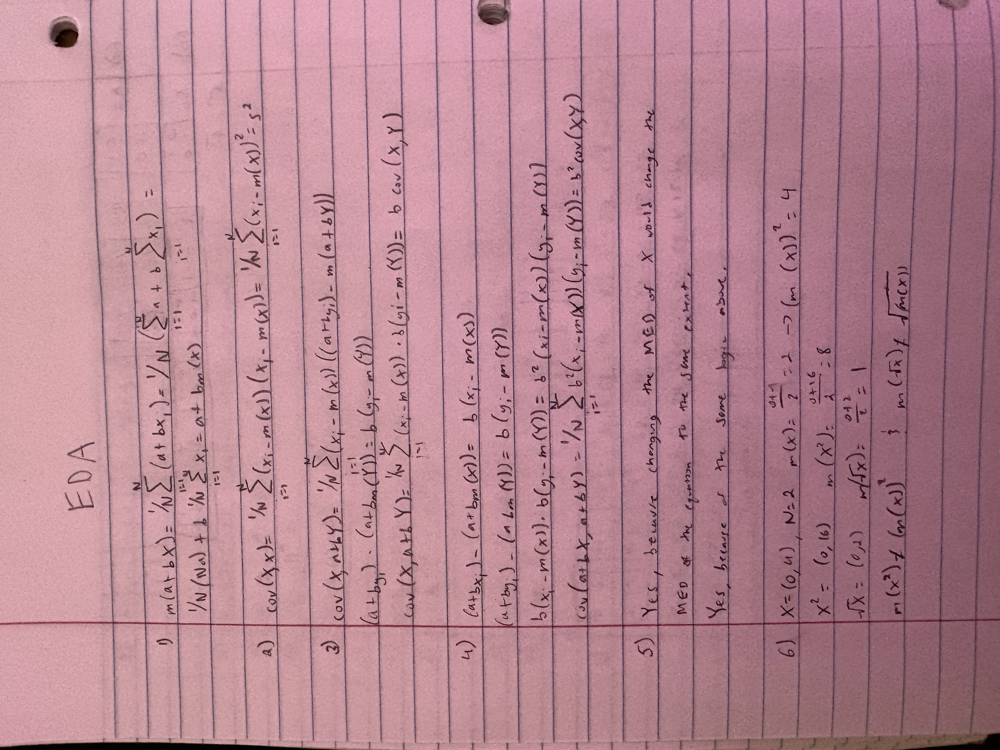

In [160]:
from IPython.display import Image, display
display(Image("IMG_2843.png"))

1. Load the `ames_prices` data with Pandas.


In [161]:
ames = pd.read_csv('datasets/ames_prices.csv')
ames.head()

,Order,PID,area,price,MS.SubClass,MS.Zoning,Lot.Frontage,Lot.Area,Street,Alley,...,Screen.Porch,Pool.Area,Pool.QC,Fence,Misc.Feature,Misc.Val,Mo.Sold,Yr.Sold,Sale.Type,Sale.Condition
0,1,526301100,1656,215000,20,RL,141.0,31770,Pave,NaN,...,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
1,2,526350040,896,105000,20,RH,80.0,11622,Pave,NaN,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
2,3,526351010,1329,172000,20,RL,81.0,14267,Pave,NaN,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
3,4,526353030,2110,244000,20,RL,93.0,11160,Pave,NaN,...,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
4,5,527105010,1629,189900,60,RL,74.0,13830,Pave,NaN,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal


2. Make a kernel density plot of price and compute a describe table. Now, make a kernel density plot of price conditional on building type, and use `.groupby()` to make a describe type for each type of building. Which building types are the most expensive, on average? Which have the highest variance in transaction prices?


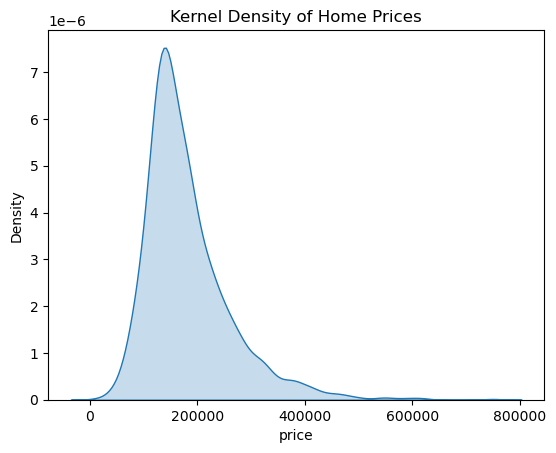

count      2930.000000
mean     180796.060068
std       79886.692357
min       12789.000000
25%      129500.000000
50%      160000.000000
75%      213500.000000
max      755000.000000
Name: price, dtype: float64

In [162]:
sns.kdeplot(data=ames, x="price", fill=True)
plt.title("Kernel Density of Home Prices")
plt.show()

ames["price"].describe()

3. Make an ECDF plot of price, and compute the sample minimum, .25 quantile, median, .75 quantile, and sample maximum (i.e. a 5-number summary).


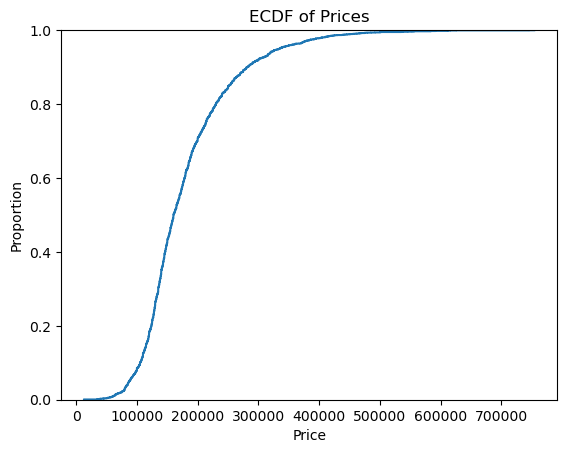

In [163]:
sns.ecdfplot(data=ames, x="price")
plt.title("ECDF of Prices")
plt.xlabel("Price")
plt.ylabel("Proportion")
plt.show()

4. Make a boxplot of price. Are there outliers? Make a boxplot of price conditional on building type. What patterns do you see?


5. Make a dummy variable indicating that an observation is an outlier.

In [164]:
Q1 = ames["price"].quantile(0.25)
Q3 = ames["price"].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

ames["price_outlier"] = ((ames["price"] < lower_bound) |(ames["price"] > upper_bound)).astype(int)
ames['price_outlier'].value_counts()
#there are 137 outliers

price_outlier
0    2793
1     137
Name: count, dtype: int64

6. Winsorize the price variable, and compute a new kernel density plot and describe table. How do the results change?

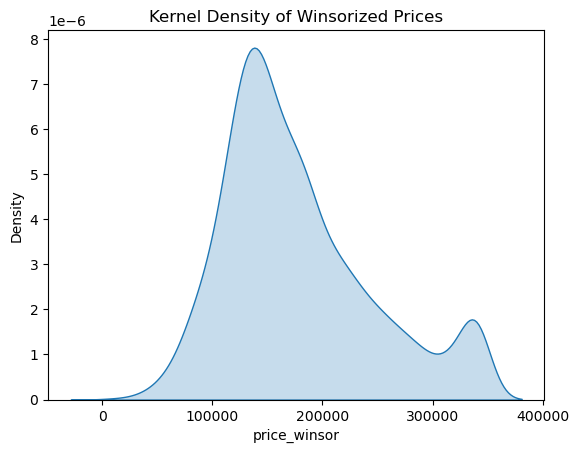

count      2930.000000
mean     177082.283959
std       67906.837135
min       12789.000000
25%      129500.000000
50%      160000.000000
75%      213500.000000
max      339500.000000
Name: price_winsor, dtype: float64

In [165]:
ames["price_winsor"] = ames["price"].clip(lower_bound, upper_bound)

sns.kdeplot(data=ames, x="price_winsor", fill=True)
plt.title("Kernel Density of Winsorized Prices")
plt.show()

ames["price_winsor"].describe()

#this reduced the maximum price which decreased the mean 
# and made the data more uniform and have a lest of spread in the std. The median and IQR range didn't change

**Q7.** This question provides some practice doing exploratory data analysis and visualization.

We'll use the `ames_prices.csv` dataset. The "relevant" variables for this question are:
  - `price` - Sale price value of the house
  - `Bldg.Type` - Building type of the house (single family home, end-of-unit townhome, duplex, interior townhome, two-family conversion)

1. Load the `college_completion.csv` data with Pandas.
2. Make a kernel density plot of price and compute a describe table. Now, make a kernel density plot of price conditional on building type, and use `.groupby()` to make a describe type for each type of building. Which building types are the most expensive, on average? Which have the highest variance in transaction prices?
3. Make an ECDF plot of price, and compute the sample minimum, .25 quantile, median, .75 quantile, and sample maximum (i.e. a 5-number summary).
4. Make a boxplot of price. Are there outliers? Make a boxplot of price conditional on building type. What patterns do you see?
5. Make a dummy variable indicating that an observation is an outlier.
6. Winsorize the price variable, and compute a new kernel density plot and describe table. How do the results change?

In [166]:
# part 1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv("datasets/ames_prices.csv")  
df.head()


,Order,PID,area,price,MS.SubClass,MS.Zoning,Lot.Frontage,Lot.Area,Street,Alley,...,Screen.Porch,Pool.Area,Pool.QC,Fence,Misc.Feature,Misc.Val,Mo.Sold,Yr.Sold,Sale.Type,Sale.Condition
0,1,526301100,1656,215000,20,RL,141.0,31770,Pave,NaN,...,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
1,2,526350040,896,105000,20,RH,80.0,11622,Pave,NaN,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
2,3,526351010,1329,172000,20,RL,81.0,14267,Pave,NaN,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
3,4,526353030,2110,244000,20,RL,93.0,11160,Pave,NaN,...,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
4,5,527105010,1629,189900,60,RL,74.0,13830,Pave,NaN,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal


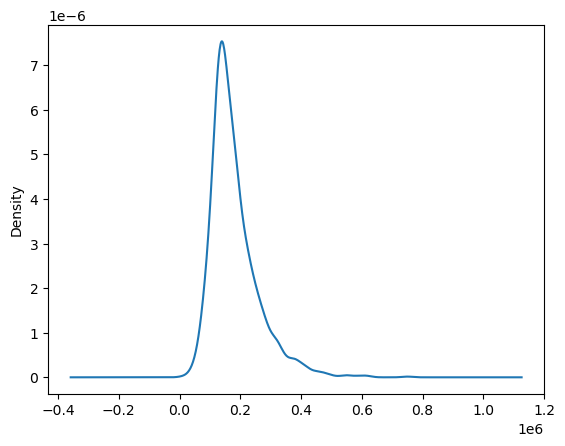

count      2930.000000
mean     180796.060068
std       79886.692357
min       12789.000000
25%      129500.000000
50%      160000.000000
75%      213500.000000
max      755000.000000
Name: price, dtype: float64

In [167]:
# part 2
df["price"].plot(kind="kde")
plt.show()
df["price"].describe()

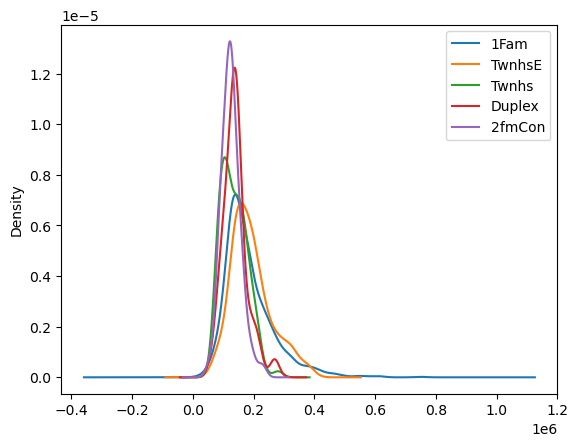

In [168]:
for t in df["Bldg.Type"].unique():
    df[df["Bldg.Type"] == t]["price"].plot(kind="kde", label=t)

plt.legend()
plt.show()

In [169]:
df.groupby("Bldg.Type")["price"].describe()

,count,mean,std,min,25%,50%,75%,max
Bldg.Type,,,,,,,,
1Fam,2425.0,184812.041237,82821.802329,12789.0,130000.0,165000.0,220000.0,755000.0
2fmCon,62.0,125581.709677,31089.239840,55000.0,106562.5,122250.0,140000.0,228950.0
Duplex,109.0,139808.935780,39498.973534,61500.0,118858.0,136905.0,153337.0,269500.0
Twnhs,101.0,135934.059406,41938.931130,73000.0,100500.0,130000.0,170000.0,280750.0
TwnhsE,233.0,192311.914163,66191.738021,71000.0,145000.0,180000.0,222000.0,392500.0


In [170]:
df.groupby("Bldg.Type")["price"].mean()

Bldg.Type
1Fam      184812.041237
2fmCon    125581.709677
Duplex    139808.935780
Twnhs     135934.059406
TwnhsE    192311.914163
Name: price, dtype: float64

In [171]:
df.groupby("Bldg.Type")["price"].var()
# the building types that are most expensive are TwnhsE

Bldg.Type
1Fam      6.859451e+09
2fmCon    9.665408e+08
Duplex    1.560169e+09
Twnhs     1.758874e+09
TwnhsE    4.381346e+09
Name: price, dtype: float64

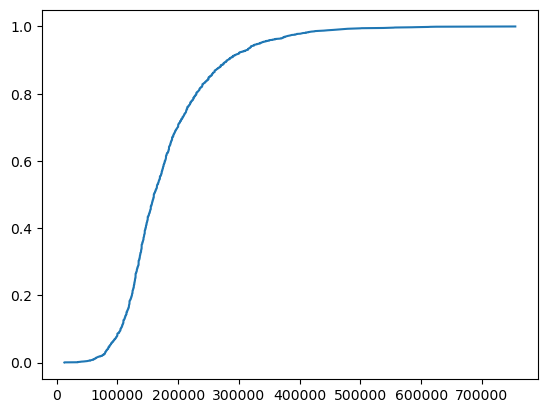

In [172]:
# part 3
x = np.sort(df["price"])
y = np.arange(1, len(x)+1) / len(x)

plt.plot(x, y)
plt.show()

In [173]:
df["price"].quantile([0, .25, .5, .75, 1])

0.00     12789.0
0.25    129500.0
0.50    160000.0
0.75    213500.0
1.00    755000.0
Name: price, dtype: float64

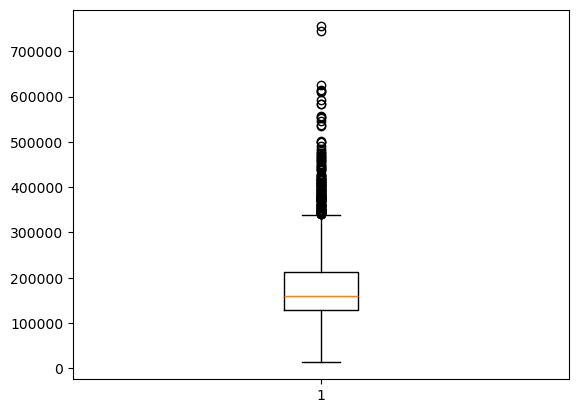

In [174]:
# part 4
plt.boxplot(df["price"])
plt.show()

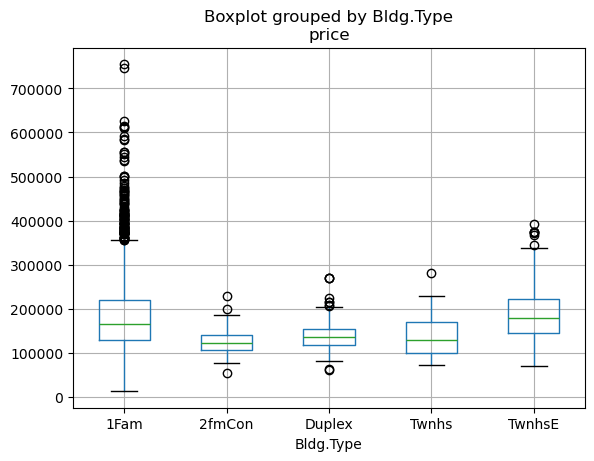

In [175]:
df.boxplot(column="price", by="Bldg.Type")
plt.show()
# Yes there are outliers. The patterns I see is that majority of outliers are 1Fam and outliers above $350000

In [176]:
# part 5
q1 = df["price"].quantile(.25)
q3 = df["price"].quantile(.75)
iqr = q3 - q1

df["outlier"] = ((df["price"] < q1 - 1.5*iqr) |
                 (df["price"] > q3 + 1.5*iqr)).astype(int)

df["outlier"].value_counts()

outlier
0    2793
1     137
Name: count, dtype: int64

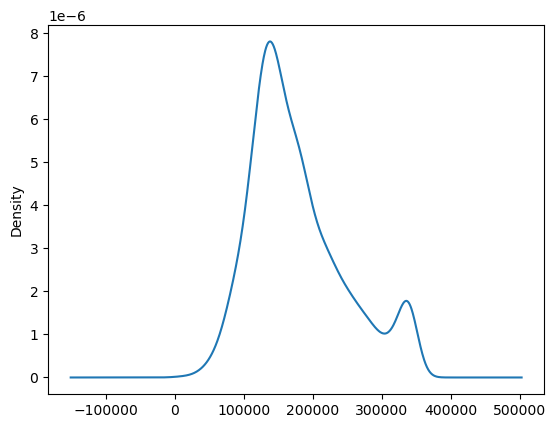

count      2930.000000
mean     177082.283959
std       67906.837135
min       12789.000000
25%      129500.000000
50%      160000.000000
75%      213500.000000
max      339500.000000
Name: price_wins, dtype: float64

In [177]:
# part 6
df["price_wins"] = df["price"].clip(
    q1 - 1.5*iqr,
    q3 + 1.5*iqr
)

df["price_wins"].plot(kind="kde")
plt.show()

df["price_wins"].describe()
# the results change after winsoriation because winsorizing capped the prices and got rid of the high end outliers. The mean decresed by a little, but the std dropped by more than $10000.